### SAR Image Despeckling Using a Convolutional Neural by ( 2 Jun 2017  ·  Puyang Wang, He Zhang, Vishal M. Patel)
### 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tensorflow.keras.layers import Input,Conv2D,ReLU,BatchNormalization,LeakyReLU
import os
from skimage.util import random_noise
import sys
import time
from tqdm.notebook import tqdm
import shutil


In [2]:
INPUT_SIZE= (64,64)
BS=16
ROOT_DIR="/kaggle/"

### Preparing DATA
- I'm using a part of this DataSet: sentinel12-image-pairs-segregated-by-terrain
- From the Agriculture set I choose the optical set s2


In [3]:
DATASET=os.path.join(ROOT_DIR,'input/sentinel12-image-pairs-segregated-by-terrain/v_2')
DATA_GEN_INPUT=os.path.join(ROOT_DIR,'DATASET')

if os.path.exists(DATA_GEN_INPUT):
    shutil.rmtree(DATA_GEN_INPUT)
os.mkdir(DATA_GEN_INPUT)

src=os.path.join(DATASET,"agri/s2")
dst=os.path.join(DATA_GEN_INPUT,"DATA")
os.symlink(src,dst)

In [289]:
def preprocessing_function(img):
    return np.float32(img/127.5-1)

In [290]:
generator=tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=preprocessing_function)
train_generator=generator.flow_from_directory(DATA_GEN_INPUT,
                                              target_size=INPUT_SIZE,
                                              class_mode=None,
                                              color_mode='grayscale',
                                              batch_size=BS,
                                              follow_links=True,)

Found 4000 images belonging to 1 classes.


- This is how the data looks like

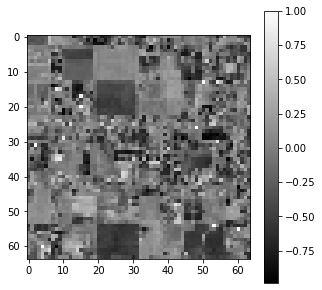

In [291]:
plt.figure(figsize=(5,5))
plt.imshow(next(train_generator)[0],cmap='gray')
plt.colorbar()

### Testing Model

In [292]:

def test_model(data_generator):
    img1,img2=next(data_generator)[:2]
    noise_var=np.random.rand()*.25
    # noise_var=.3
    noisy_img1=random_noise(img1,mode='speckle',var=noise_var,clip=True)
    noisy_img2=random_noise(img2,mode='speckle',var=noise_var,clip=True)
    noisy_img1=np.expand_dims(noisy_img1,axis=[0,-1])
    noisy_img2=np.expand_dims(noisy_img2,axis=[0,-1])
    denoised_img1=model.predict(noisy_img1)
    denoised_img2=model.predict(noisy_img2)
    fig,ax=plt.subplots(3,2,figsize=(10,12))
    mapple=ax[0,0].imshow(img1)
    plt.colorbar(mapple,ax=ax[0,0])
    mapple=ax[0,1].imshow(img2)
    plt.colorbar(mapple,ax=ax[0,1])
    mapple=ax[1,0].imshow(noisy_img1[0].reshape(INPUT_SIZE))
    plt.colorbar(mapple,ax=ax[1,0])
    mapple=ax[1,1].imshow(noisy_img2[0].reshape(INPUT_SIZE))
    plt.colorbar(mapple,ax=ax[1,1])
    mapple=ax[2,0].imshow(denoised_img1[0].reshape(INPUT_SIZE))
    plt.colorbar(mapple,ax=ax[2,0])
    mapple=ax[2,1].imshow(denoised_img2[0].reshape(INPUT_SIZE))
    plt.colorbar(mapple,ax=ax[2,1])
    plt.show()

### Model Creation

In [313]:
def create_model(input_shape=(256,256,1)):
    input_layer=Input(shape=input_shape)
    x=Conv2D(filters=64,kernel_size=(3,3),padding='same')(input_layer)
    x=LeakyReLU(.2)(x)
#   Here I'm using dialation in convolution layers but in the original paper There are NO dialation used
    for i in range(1,5):
        x=Conv2D(filters=64,kernel_size=(3,3),dilation_rate=i,padding='same',)(x)
        x=BatchNormalization()(x)
        x=LeakyReLU(.2)(x)
    for i in range(4,0,-1):
        x=Conv2D(filters=64,kernel_size=(3,3),dilation_rate=i,padding='same')(x)
        x=BatchNormalization()(x)
        x=ReLU()(x)
    x=Conv2D(filters=1,kernel_size=(3,3),padding='same')(x)
    x=ReLU()(x) 
    x= tf.keras.layers.Lambda(lambda x:x+tf.constant(1e-7))(x)
    x=tf.math.divide(input_layer,x)

    x=tf.math.tanh(x)
    return tf.keras.Model(inputs=input_layer,outputs=x)
    

### The loss function 
-  I'm using MeanSquaredError and total_variation to implement the loss function 

In [314]:
MSE=tf.keras.losses.MeanSquaredError(reduction='none')
def loss_fn(y_true,y_pred,l_tv=.0002):
    mse=tf.reduce_sum(MSE(y_true,y_pred))
    variational_loss=tf.image.total_variation(y_pred)
    weight_loss = tf.reduce_sum(tf.math.abs(tf.math.divide(1,y_pred+1e-5)))
    total_loss=mse+l_tv*variational_loss
    return tf.reduce_mean(total_loss),tf.reduce_mean(mse),tf.reduce_mean(variational_loss)
    

### Training 

In [327]:
@tf.function
def step(noisy_data, clean_data):
    with tf.GradientTape() as tape:
        pred = model(noisy_data,training=True) 
        total_loss,loss_euclidian,loss_tv = loss_fn(clean_data, pred)
        loss=tf.add_n([total_loss],model.losses)
    grads = tape.gradient(total_loss, model.trainable_weights)
    opt.apply_gradients(zip(grads, model.trainable_weights))
    return loss,loss_euclidian,loss_tv

In [316]:
model=create_model(list(INPUT_SIZE)+[1])

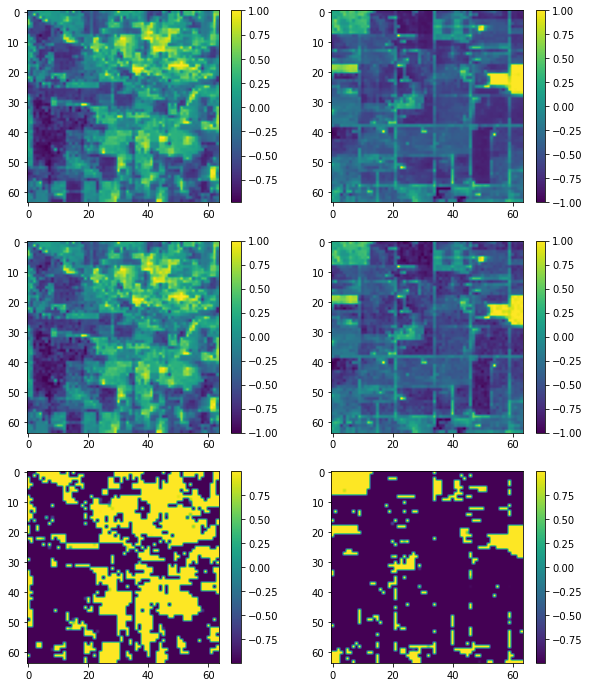

In [317]:
test_model(train_generator)

[INFO] starting epoch 1/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1189.8438720703125 loss_euclidian:  1189.587890625 loss_tv:  1279.623046875


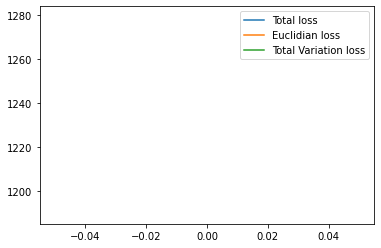

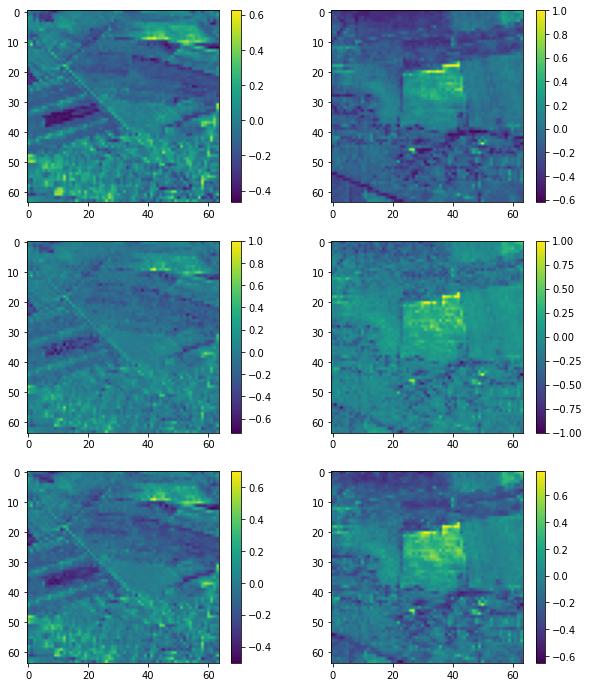

took 0.3753 minutes
[INFO] starting epoch 2/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1110.9345703125 loss_euclidian:  1110.6834716796875 loss_tv:  1257.82080078125
took 0.3084 minutes
[INFO] starting epoch 3/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1112.1204833984375 loss_euclidian:  1111.8717041015625 loss_tv:  1244.22021484375
took 0.3031 minutes
[INFO] starting epoch 4/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1046.6190185546875 loss_euclidian:  1046.3782958984375 loss_tv:  1203.3330078125
took 0.3107 minutes
[INFO] starting epoch 5/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1038.15087890625 loss_euclidian:  1037.9124755859375 loss_tv:  1191.9888916015625
took 0.3157 minutes
[INFO] starting epoch 6/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1187.0997314453125 loss_euclidian:  1186.8360595703125 loss_tv:  1316.040771484375


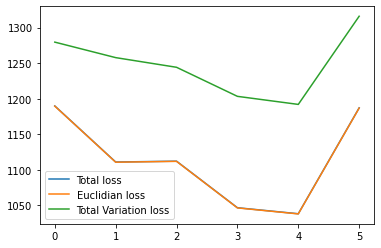

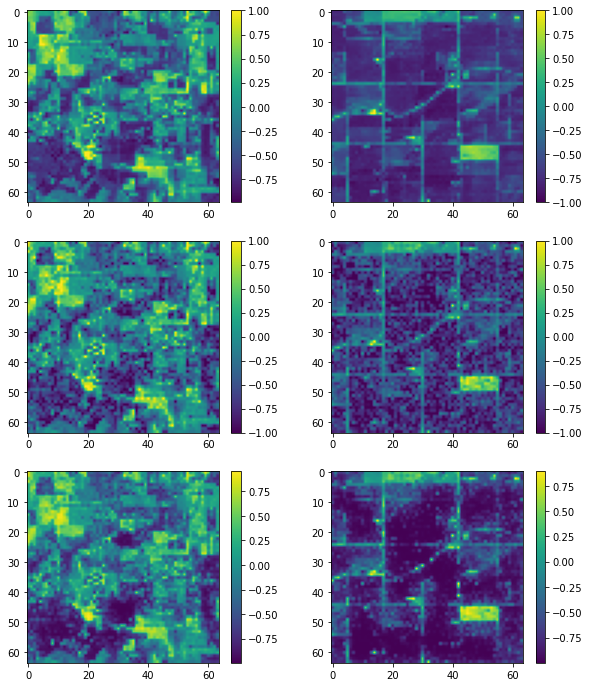

took 0.3275 minutes
[INFO] starting epoch 7/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1266.87451171875 loss_euclidian:  1266.604736328125 loss_tv:  1347.2777099609375
took 0.3092 minutes
[INFO] starting epoch 8/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1144.34765625 loss_euclidian:  1144.1055908203125 loss_tv:  1210.4022216796875
took 0.3038 minutes
[INFO] starting epoch 9/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1156.448486328125 loss_euclidian:  1156.201904296875 loss_tv:  1232.28271484375
took 0.3098 minutes
[INFO] starting epoch 10/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1007.3489990234375 loss_euclidian:  1007.115234375 loss_tv:  1165.115478515625
took 0.3006 minutes
[INFO] starting epoch 11/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1029.1971435546875 loss_euclidian:  1028.966064453125 loss_tv:  1155.7779541015625


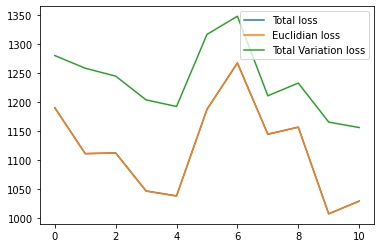

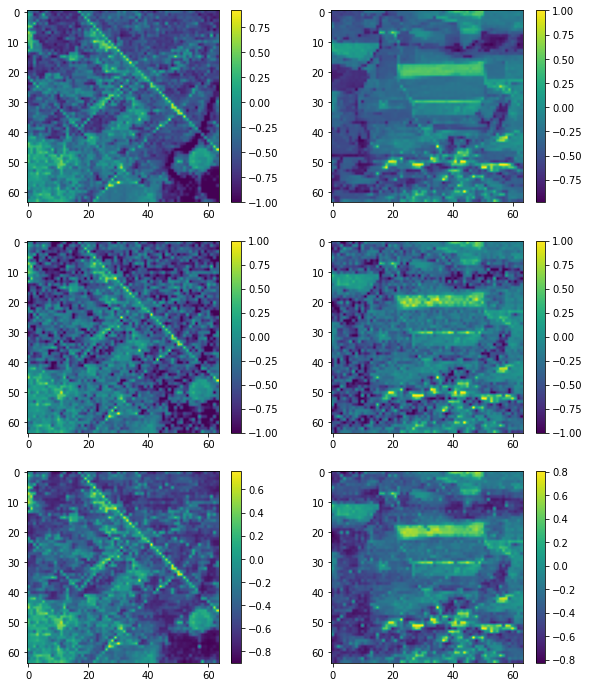

took 0.3316 minutes
[INFO] starting epoch 12/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1040.376220703125 loss_euclidian:  1040.1405029296875 loss_tv:  1181.802001953125
took 0.3077 minutes
[INFO] starting epoch 13/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  963.2940063476562 loss_euclidian:  963.0654907226562 loss_tv:  1144.5562744140625
took 0.3005 minutes
[INFO] starting epoch 14/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  943.1472778320312 loss_euclidian:  942.92431640625 loss_tv:  1115.8153076171875
took 0.3103 minutes
[INFO] starting epoch 15/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  919.3170776367188 loss_euclidian:  919.0941162109375 loss_tv:  1116.094970703125
took 0.3052 minutes
[INFO] starting epoch 16/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  996.9192504882812 loss_euclidian:  996.6773071289062 loss_tv:  1206.2896728515625


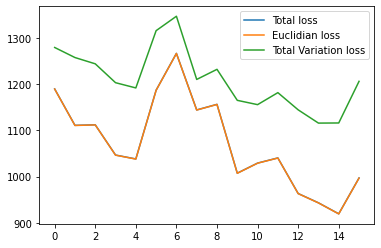

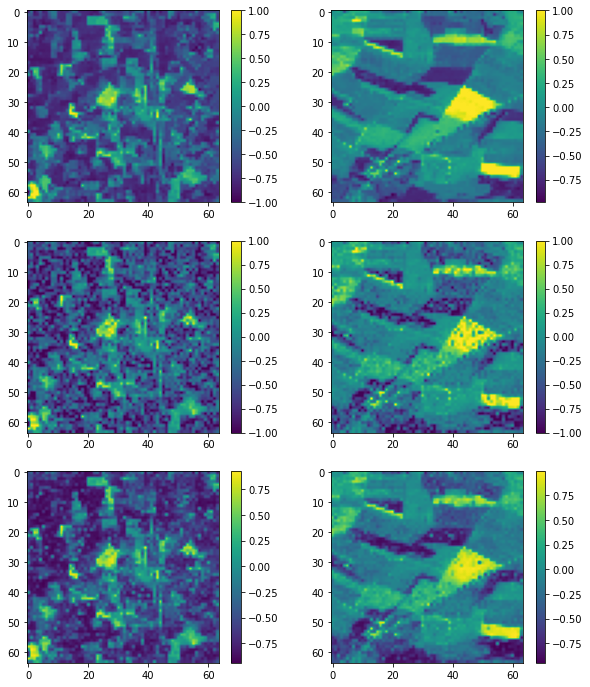

took 0.3293 minutes
[INFO] starting epoch 17/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  970.0177612304688 loss_euclidian:  969.787109375 loss_tv:  1149.19091796875
took 0.3083 minutes
[INFO] starting epoch 18/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  912.6417236328125 loss_euclidian:  912.4180297851562 loss_tv:  1116.6719970703125
took 0.3058 minutes
[INFO] starting epoch 19/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  884.4444580078125 loss_euclidian:  884.2228393554688 loss_tv:  1107.810302734375
took 0.308 minutes
[INFO] starting epoch 20/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  915.7139892578125 loss_euclidian:  915.492431640625 loss_tv:  1108.4462890625
took 0.2993 minutes
[INFO] starting epoch 21/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  917.0149536132812 loss_euclidian:  916.7954711914062 loss_tv:  1099.534423828125


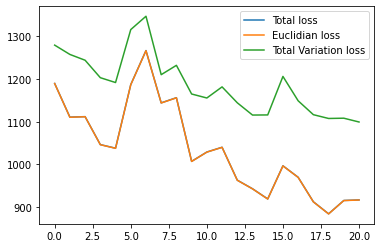

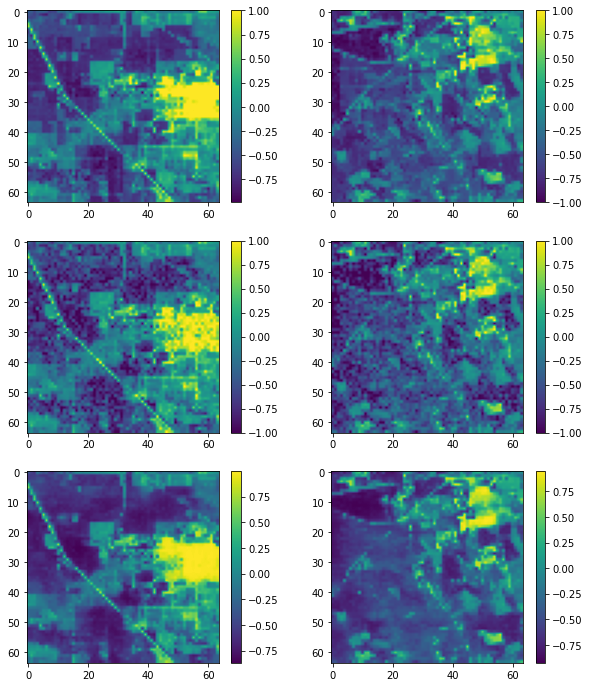

took 0.3461 minutes
[INFO] starting epoch 22/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  888.8228759765625 loss_euclidian:  888.6036376953125 loss_tv:  1095.111328125
took 0.3053 minutes
[INFO] starting epoch 23/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  884.1748046875 loss_euclidian:  883.9571533203125 loss_tv:  1089.3697509765625
took 0.3158 minutes
[INFO] starting epoch 24/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  843.077880859375 loss_euclidian:  842.860107421875 loss_tv:  1086.35986328125
took 0.331 minutes
[INFO] starting epoch 25/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  904.6142578125 loss_euclidian:  904.3974609375 loss_tv:  1085.061279296875
took 0.3728 minutes
[INFO] starting epoch 26/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  865.719970703125 loss_euclidian:  865.503173828125 loss_tv:  1085.903076171875


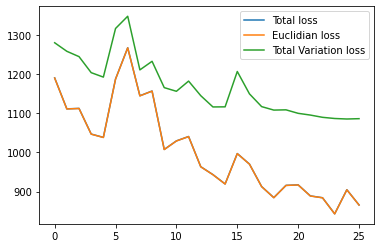

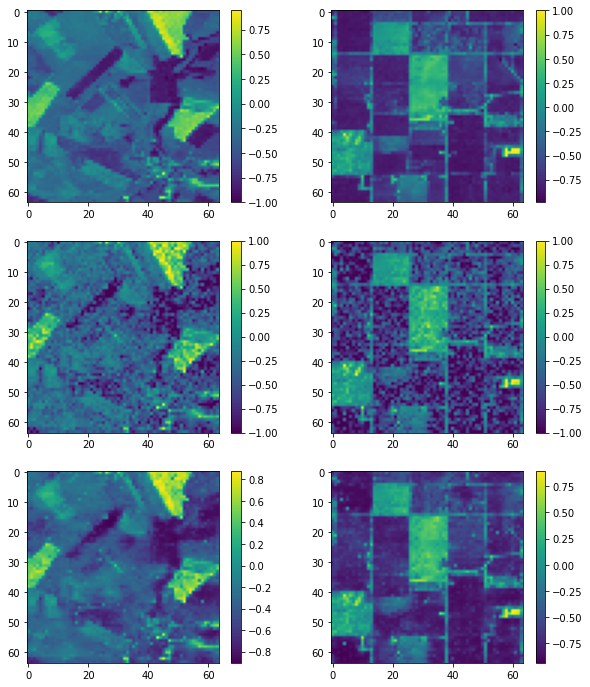

took 0.411 minutes
[INFO] starting epoch 27/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  871.5288696289062 loss_euclidian:  871.3151245117188 loss_tv:  1069.9598388671875
took 0.3064 minutes
[INFO] starting epoch 28/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  795.1015014648438 loss_euclidian:  794.885986328125 loss_tv:  1075.396484375
took 0.3056 minutes
[INFO] starting epoch 29/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  842.7916870117188 loss_euclidian:  842.5750122070312 loss_tv:  1082.078125
took 0.3037 minutes
[INFO] starting epoch 30/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  943.1541137695312 loss_euclidian:  942.9312744140625 loss_tv:  1115.3028564453125
took 0.3036 minutes
[INFO] starting epoch 31/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  875.9085693359375 loss_euclidian:  875.6903686523438 loss_tv:  1091.360107421875


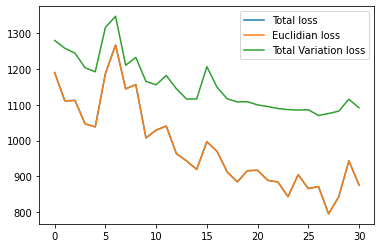

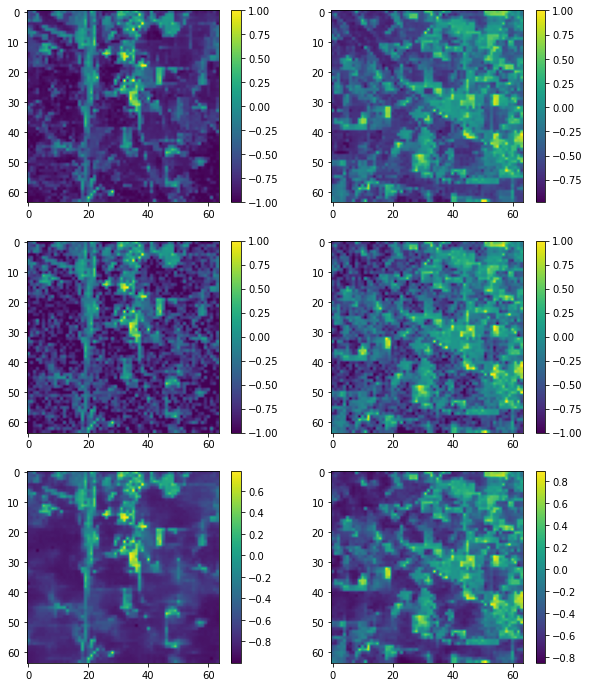

took 0.3297 minutes
[INFO] starting epoch 32/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  929.755859375 loss_euclidian:  929.5332641601562 loss_tv:  1112.6002197265625
took 0.3011 minutes
[INFO] starting epoch 33/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  841.7662353515625 loss_euclidian:  841.5488891601562 loss_tv:  1085.43115234375
took 0.3046 minutes
[INFO] starting epoch 34/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  840.8029174804688 loss_euclidian:  840.5882568359375 loss_tv:  1072.6195068359375
took 0.3083 minutes
[INFO] starting epoch 35/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  827.3187255859375 loss_euclidian:  827.1055908203125 loss_tv:  1066.2283935546875
took 0.3028 minutes
[INFO] starting epoch 36/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  848.500732421875 loss_euclidian:  848.2847290039062 loss_tv:  1082.9447021484375


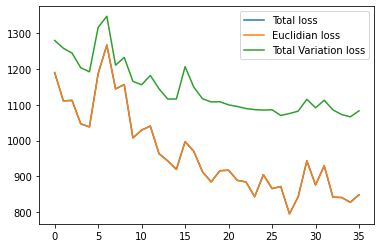

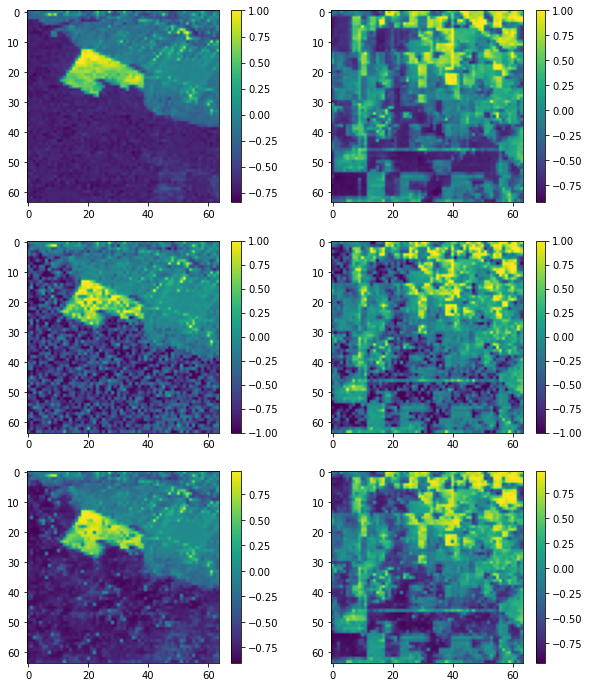

took 0.3278 minutes
[INFO] starting epoch 37/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  819.7626342773438 loss_euclidian:  819.5472412109375 loss_tv:  1076.83642578125
took 0.3011 minutes
[INFO] starting epoch 38/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  843.481201171875 loss_euclidian:  843.2681884765625 loss_tv:  1063.96533203125
took 0.3105 minutes
[INFO] starting epoch 39/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  806.0157470703125 loss_euclidian:  805.8031005859375 loss_tv:  1063.874755859375
took 0.3134 minutes
[INFO] starting epoch 40/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  845.5879516601562 loss_euclidian:  845.3753051757812 loss_tv:  1066.124267578125
took 0.3068 minutes
[INFO] starting epoch 41/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  829.8265380859375 loss_euclidian:  829.6141967773438 loss_tv:  1062.4486083984375


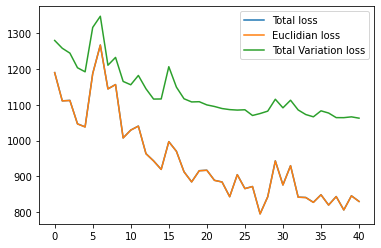

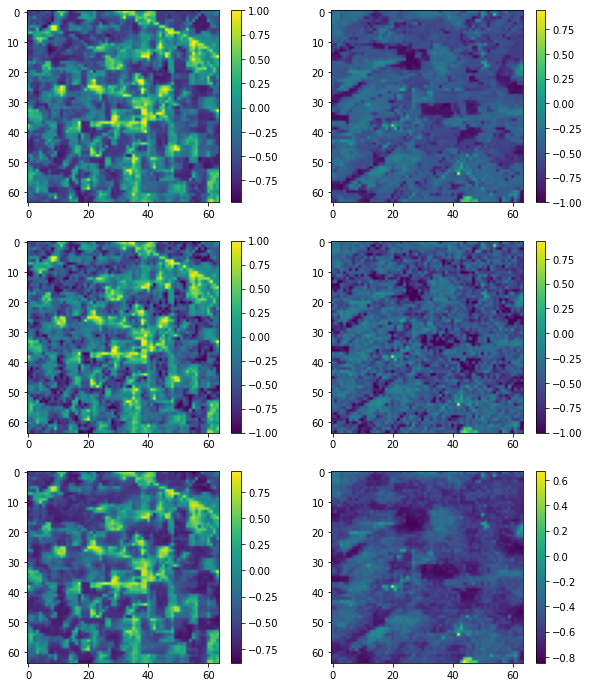

took 0.3407 minutes
[INFO] starting epoch 42/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  805.505126953125 loss_euclidian:  805.2929077148438 loss_tv:  1060.9691162109375
took 0.3064 minutes
[INFO] starting epoch 43/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  827.727294921875 loss_euclidian:  827.51123046875 loss_tv:  1080.30224609375
took 0.3039 minutes
[INFO] starting epoch 44/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  783.3428344726562 loss_euclidian:  783.131591796875 loss_tv:  1059.6383056640625
took 0.3035 minutes
[INFO] starting epoch 45/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  839.0455322265625 loss_euclidian:  838.8345947265625 loss_tv:  1054.523681640625
took 0.3068 minutes
[INFO] starting epoch 46/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  801.3924560546875 loss_euclidian:  801.1810913085938 loss_tv:  1054.519287109375


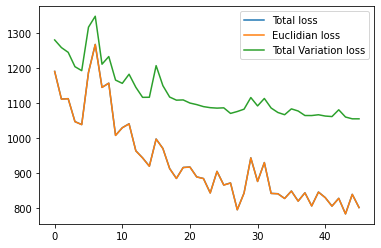

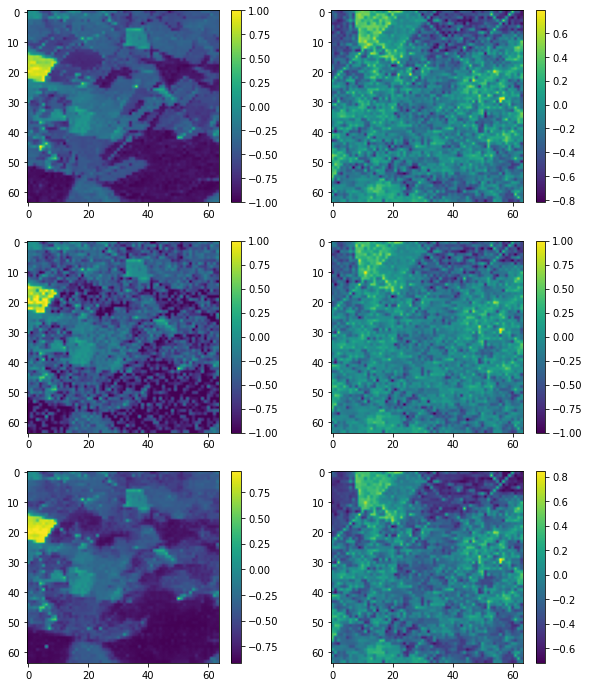

took 0.3369 minutes
[INFO] starting epoch 47/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  797.3571166992188 loss_euclidian:  797.1453857421875 loss_tv:  1056.9476318359375
took 0.306 minutes
[INFO] starting epoch 48/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  781.7059936523438 loss_euclidian:  781.4874877929688 loss_tv:  1091.2381591796875
took 0.3113 minutes
[INFO] starting epoch 49/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  820.9685668945312 loss_euclidian:  820.7526245117188 loss_tv:  1077.954345703125
took 0.3 minutes
[INFO] starting epoch 50/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  903.3013916015625 loss_euclidian:  903.0798950195312 loss_tv:  1107.1844482421875
took 0.3077 minutes
[INFO] starting epoch 51/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  817.5989990234375 loss_euclidian:  817.3843994140625 loss_tv:  1074.7188720703125


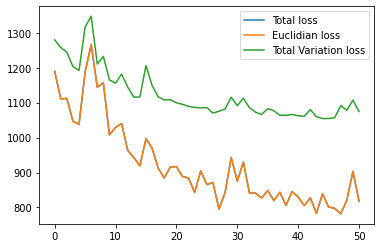

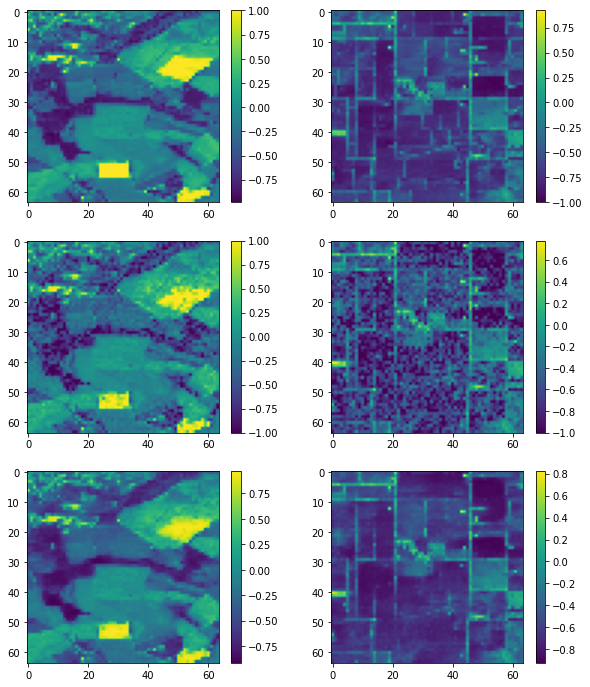

took 0.3283 minutes
[INFO] starting epoch 52/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  772.9954833984375 loss_euclidian:  772.783203125 loss_tv:  1060.8973388671875
took 0.3132 minutes
[INFO] starting epoch 53/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  842.0739135742188 loss_euclidian:  841.8604736328125 loss_tv:  1067.3228759765625
took 0.3411 minutes
[INFO] starting epoch 54/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  773.8591918945312 loss_euclidian:  773.64697265625 loss_tv:  1060.294921875
took 0.3042 minutes
[INFO] starting epoch 55/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  760.2901000976562 loss_euclidian:  760.078125 loss_tv:  1058.10205078125
took 0.3075 minutes
[INFO] starting epoch 56/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  816.2296752929688 loss_euclidian:  816.0186767578125 loss_tv:  1057.34814453125


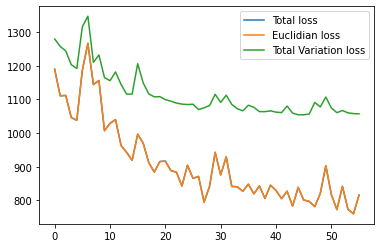

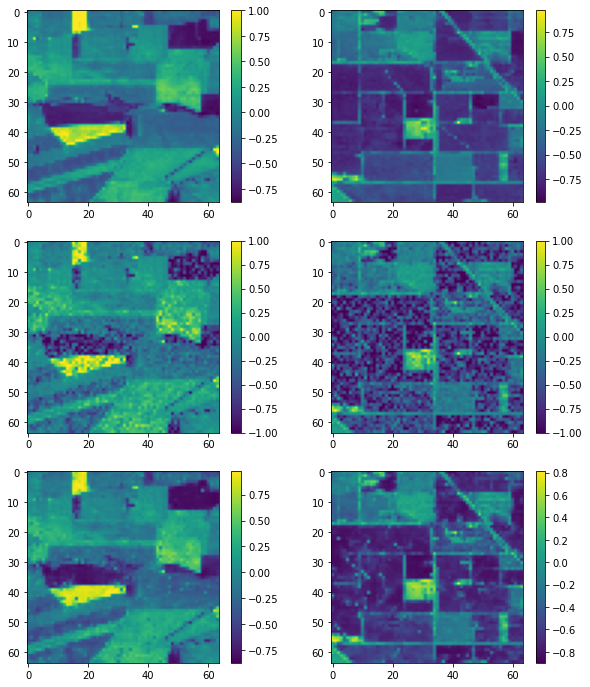

took 0.3278 minutes
[INFO] starting epoch 57/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  777.3793334960938 loss_euclidian:  777.168212890625 loss_tv:  1055.9779052734375
took 0.3136 minutes
[INFO] starting epoch 58/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  757.2171630859375 loss_euclidian:  757.006103515625 loss_tv:  1055.1004638671875
took 0.3089 minutes
[INFO] starting epoch 59/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  823.6095581054688 loss_euclidian:  823.3989868164062 loss_tv:  1052.8582763671875
took 0.3103 minutes
[INFO] starting epoch 60/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  821.4013671875 loss_euclidian:  821.1884765625 loss_tv:  1063.7613525390625
took 0.3053 minutes
[INFO] starting epoch 61/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  800.6415405273438 loss_euclidian:  800.4286499023438 loss_tv:  1064.4410400390625


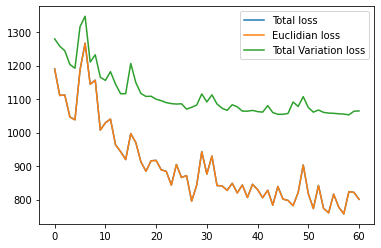

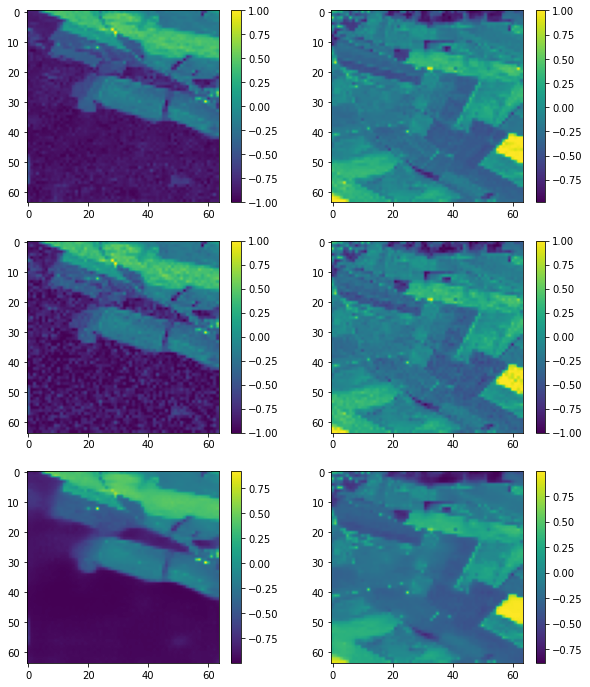

took 0.3283 minutes
[INFO] starting epoch 62/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  750.915283203125 loss_euclidian:  750.7045288085938 loss_tv:  1054.3460693359375
took 0.3141 minutes
[INFO] starting epoch 63/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  774.2139282226562 loss_euclidian:  774.0042114257812 loss_tv:  1048.7684326171875
took 0.3016 minutes
[INFO] starting epoch 64/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1079.1956787109375 loss_euclidian:  1078.94677734375 loss_tv:  1243.5272216796875
took 0.3089 minutes
[INFO] starting epoch 65/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  922.51611328125 loss_euclidian:  922.2914428710938 loss_tv:  1119.927490234375
took 0.3118 minutes
[INFO] starting epoch 66/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  846.0189208984375 loss_euclidian:  845.8038330078125 loss_tv:  1074.89404296875


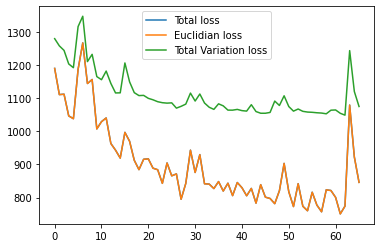

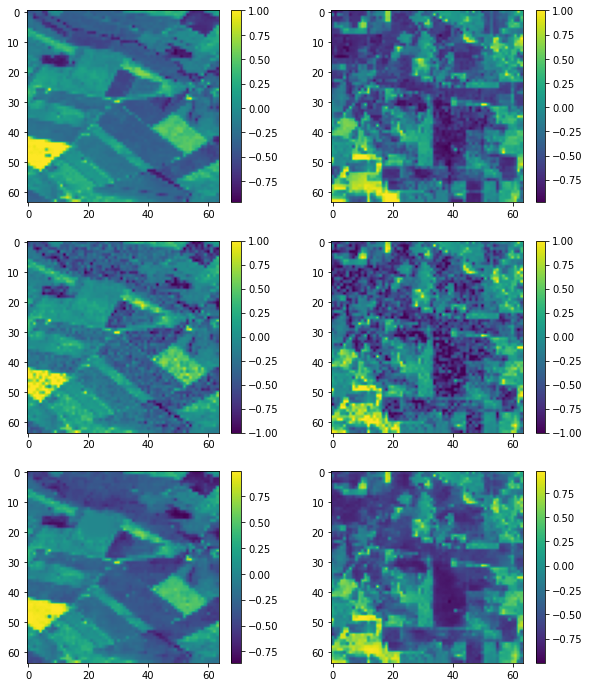

took 0.3366 minutes
[INFO] starting epoch 67/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  880.5279541015625 loss_euclidian:  880.3080444335938 loss_tv:  1097.6246337890625
took 0.3084 minutes
[INFO] starting epoch 68/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  804.20361328125 loss_euclidian:  803.986572265625 loss_tv:  1086.76708984375
took 0.3022 minutes
[INFO] starting epoch 69/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  788.0078735351562 loss_euclidian:  787.7942504882812 loss_tv:  1068.9744873046875
took 0.3109 minutes
[INFO] starting epoch 70/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  825.6071166992188 loss_euclidian:  825.3946533203125 loss_tv:  1062.9669189453125
took 0.3019 minutes
[INFO] starting epoch 71/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  823.384521484375 loss_euclidian:  823.1707763671875 loss_tv:  1066.932861328125


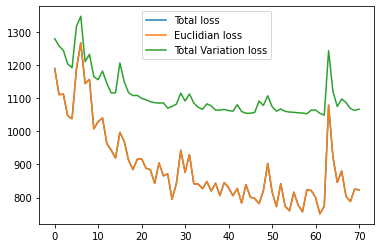

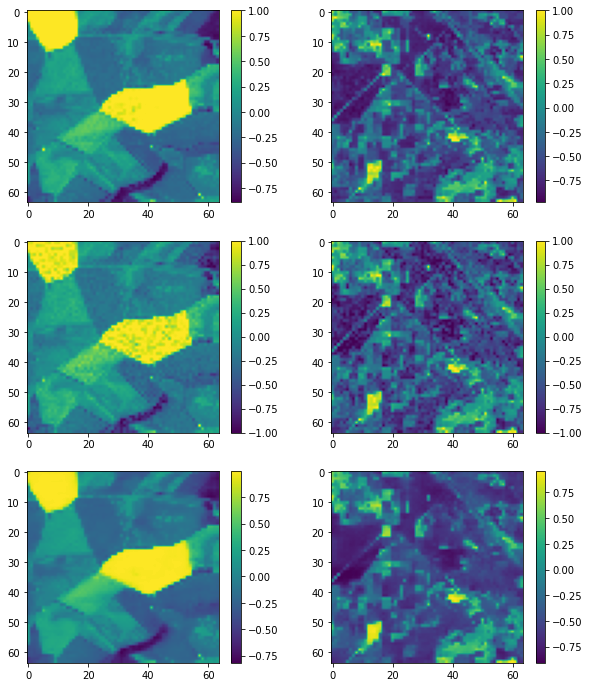

took 0.3342 minutes
[INFO] starting epoch 72/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  798.861328125 loss_euclidian:  798.6499633789062 loss_tv:  1056.284912109375
took 0.3073 minutes
[INFO] starting epoch 73/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  800.8026123046875 loss_euclidian:  800.591552734375 loss_tv:  1053.774169921875
took 0.2954 minutes
[INFO] starting epoch 74/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  775.8912963867188 loss_euclidian:  775.680419921875 loss_tv:  1054.7762451171875
took 0.3105 minutes
[INFO] starting epoch 75/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  822.6127319335938 loss_euclidian:  822.4013061523438 loss_tv:  1056.51806640625
took 0.3067 minutes
[INFO] starting epoch 76/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  768.0160522460938 loss_euclidian:  767.806640625 loss_tv:  1047.392578125


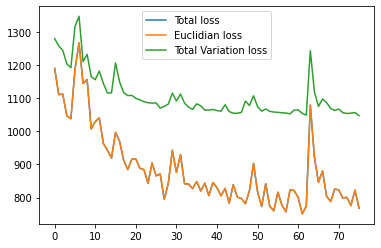

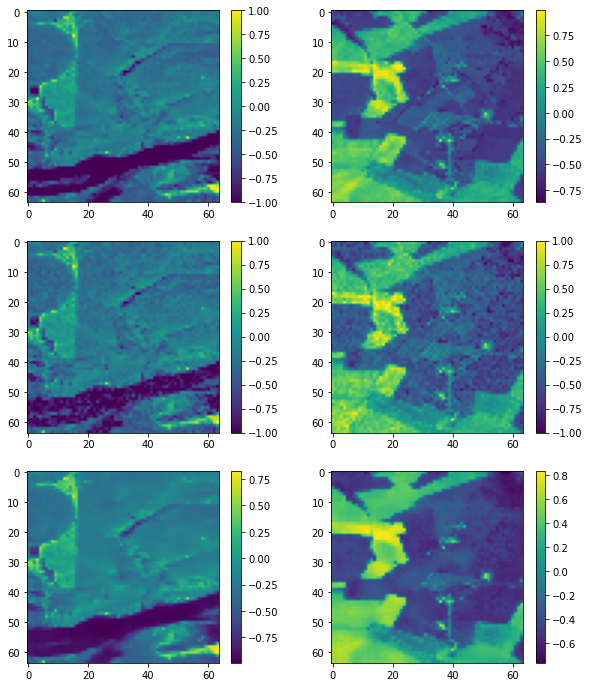

took 0.3318 minutes
[INFO] starting epoch 77/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  786.7260131835938 loss_euclidian:  786.514892578125 loss_tv:  1055.71337890625
took 0.2983 minutes
[INFO] starting epoch 78/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  800.362548828125 loss_euclidian:  800.1498413085938 loss_tv:  1063.9058837890625
took 0.3094 minutes
[INFO] starting epoch 79/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  891.7962646484375 loss_euclidian:  891.572021484375 loss_tv:  1120.5750732421875
took 0.3093 minutes
[INFO] starting epoch 80/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  791.034423828125 loss_euclidian:  790.8237915039062 loss_tv:  1053.182861328125
took 0.3059 minutes
[INFO] starting epoch 81/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  807.6100463867188 loss_euclidian:  807.4006958007812 loss_tv:  1047.689208984375


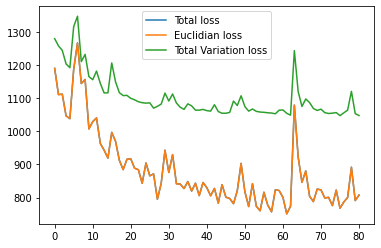

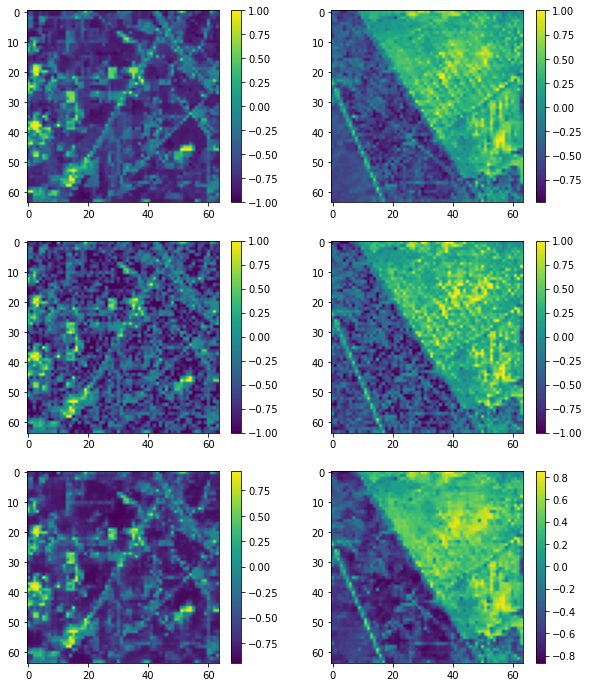

took 0.3319 minutes
[INFO] starting epoch 82/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  772.0109252929688 loss_euclidian:  771.799560546875 loss_tv:  1056.7132568359375
took 0.3032 minutes
[INFO] starting epoch 83/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  780.89208984375 loss_euclidian:  780.6824340820312 loss_tv:  1049.4498291015625
took 0.3032 minutes
[INFO] starting epoch 84/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  791.1734008789062 loss_euclidian:  790.962646484375 loss_tv:  1054.4891357421875
took 0.3002 minutes
[INFO] starting epoch 85/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  790.4785766601562 loss_euclidian:  790.269287109375 loss_tv:  1048.3480224609375
took 0.3078 minutes
[INFO] starting epoch 86/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  796.130859375 loss_euclidian:  795.9221801757812 loss_tv:  1043.43798828125


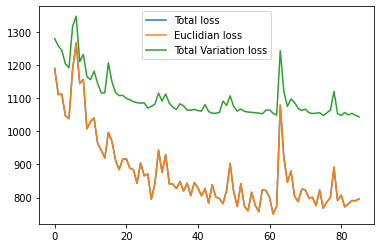

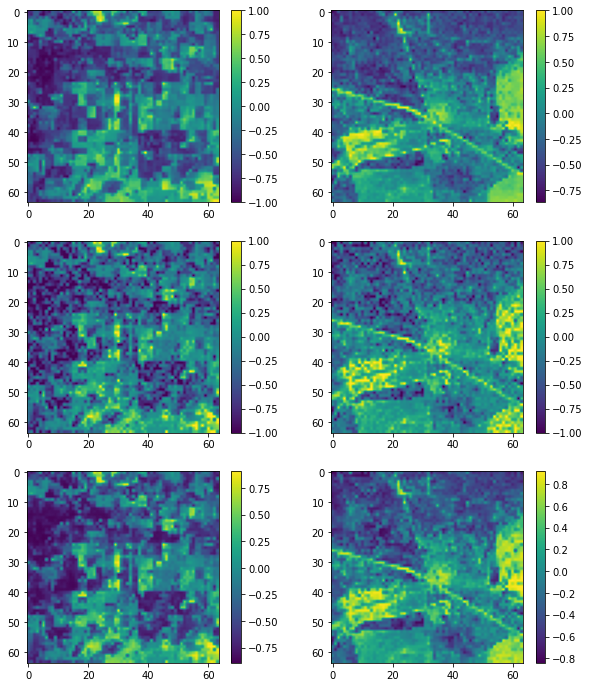

took 0.3291 minutes
[INFO] starting epoch 87/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  713.4960327148438 loss_euclidian:  713.287841796875 loss_tv:  1039.77392578125
took 0.3031 minutes
[INFO] starting epoch 88/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  795.827880859375 loss_euclidian:  795.6176147460938 loss_tv:  1051.8994140625
took 0.3245 minutes
[INFO] starting epoch 89/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  736.9935913085938 loss_euclidian:  736.7842407226562 loss_tv:  1048.3804931640625
took 0.3364 minutes
[INFO] starting epoch 90/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  757.2857666015625 loss_euclidian:  757.0763549804688 loss_tv:  1048.2193603515625
took 0.3483 minutes
[INFO] starting epoch 91/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  788.7214965820312 loss_euclidian:  788.5128173828125 loss_tv:  1044.542236328125


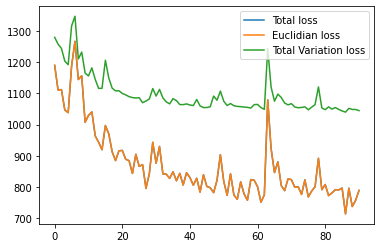

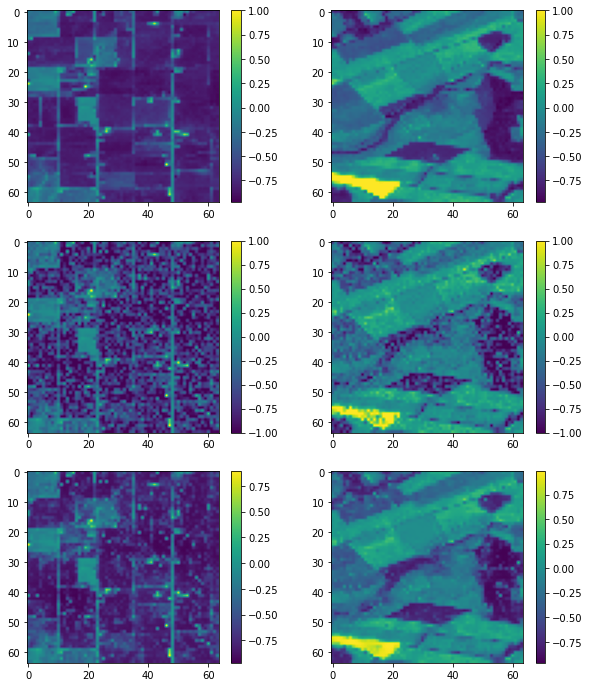

took 0.3708 minutes
[INFO] starting epoch 92/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  757.6614379882812 loss_euclidian:  757.45263671875 loss_tv:  1043.04248046875
took 0.3456 minutes
[INFO] starting epoch 93/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  769.0244140625 loss_euclidian:  768.8142700195312 loss_tv:  1052.81396484375
took 0.3523 minutes
[INFO] starting epoch 94/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  772.17236328125 loss_euclidian:  771.963134765625 loss_tv:  1044.8826904296875
took 0.3392 minutes
[INFO] starting epoch 95/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  751.6945190429688 loss_euclidian:  751.4854125976562 loss_tv:  1044.9639892578125
took 0.3396 minutes
[INFO] starting epoch 96/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  764.7655029296875 loss_euclidian:  764.5554809570312 loss_tv:  1050.308837890625


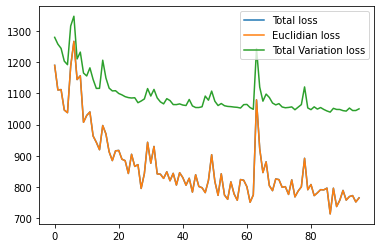

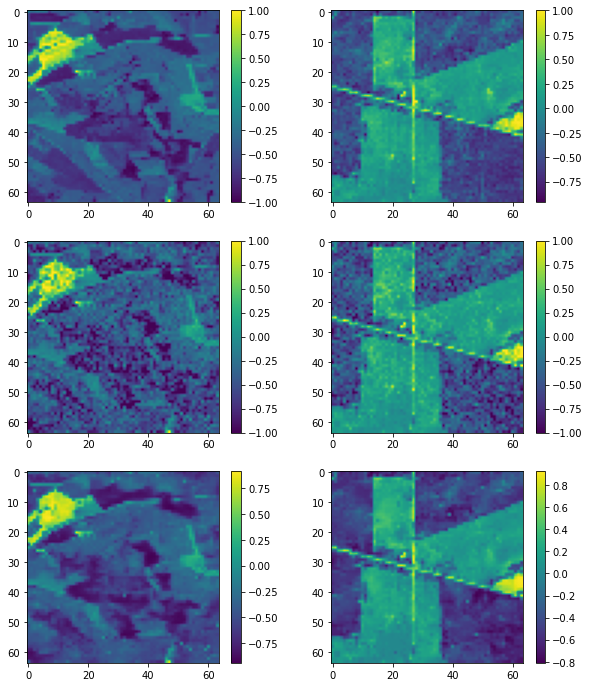

took 0.3737 minutes
[INFO] starting epoch 97/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  766.7521362304688 loss_euclidian:  766.5424194335938 loss_tv:  1049.06298828125
took 0.3606 minutes
[INFO] starting epoch 98/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  777.523681640625 loss_euclidian:  777.310546875 loss_tv:  1064.15771484375
took 0.3538 minutes
[INFO] starting epoch 99/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  724.4769897460938 loss_euclidian:  724.2678833007812 loss_tv:  1045.609130859375
took 0.3352 minutes
[INFO] starting epoch 100/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  726.2662353515625 loss_euclidian:  726.0574340820312 loss_tv:  1046.2294921875
took 0.302 minutes


In [328]:
EPOCHS = 100 # The paper has trained the model for 2000 epochs
lr=2e-3

max_var=.3

opt = tf.keras.optimizers.Nadam(learning_rate=lr) # in the paper Adam optimizer with lr=2e-5 ,beta_1=.5 is used but I found this one converging faster
train_loss=[]
n_instances=train_generator.n
numUpdates = int(n_instances / BS)
# loop over the number of epochs
for epoch in range(0, EPOCHS): 
    # show the current epoch number
    print("[INFO] starting epoch {}/{} , learning_rate {}".format(
        epoch + 1, EPOCHS,lr), end="")
    sys.stdout.flush()
    epochStart = time.time()
    loss = 0
    loss_batch = []
    for i in tqdm(range(0, numUpdates)):
        clean_data = next(train_generator)
#         I Use Speckle Noise with Random Variance you can try a constant variance 
        noisy_data=random_noise(clean_data,mode='speckle',var=np.random.uniform(high=max_var))
        loss = step(noisy_data,clean_data)
        loss_batch.append((loss))
    loss_batch = np.array(loss_batch)
    loss_batch = np.sum(loss_batch, axis=0) / len(loss_batch)
    total_loss,loss_euclidian,loss_tv=loss_batch
    train_loss.append(loss_batch)
    print('\nTraining_loss # ', 'total loss: ', float(total_loss),
          'loss_euclidian: ', float(loss_euclidian),
          'loss_tv: ', float(loss_tv),)
    if epoch % 5==0:
        plt.plot(train_loss)
        plt.legend(['Total loss','Euclidian loss','Total Variation loss'])
        plt.show()
        test_model(train_generator)
    sys.stdout.flush()
    # show timing information for the epoch
    epochEnd = time.time()
    elapsed = (epochEnd - epochStart) / 60.0
    print("took {:.4} minutes".format(elapsed))

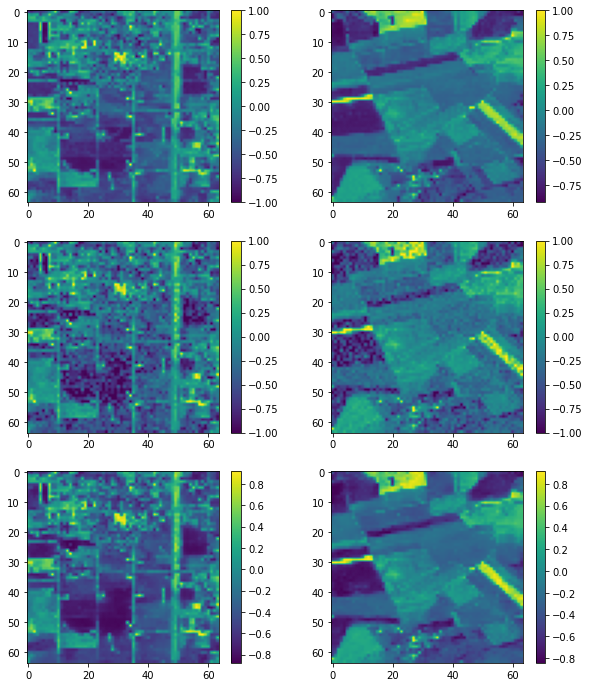

In [332]:
test_model(train_generator)